In [14]:
import pytorch_lightning as pl
from TFBS_negatives.data import DataModule
from TFBS_negatives.models import TFmodel
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from sklearn.calibration import calibration_curve

In [2]:
model_ckpt_path = "/data/home/natant/Negatives/Runs/Review_rerun/GM12878_ATF2_(SC-81188)_dinucl_sampled_CV-0_20251030_22:33_epoch=10_val_loss=0.66_AUROC=0.77.ckpt"
cellline_file = "/data/home/natant/Negatives/Data/Encode690/ENCODE_hg38_subset_101bp_celltypes_ATAC_H5_all_chr/GM12878.h5t"

In [4]:
Dmod = DataModule(cellline_file, TF="ATF2_(SC-81188)", batch_size=256, neg_mode="dinucl_sampled", cross_val_set=0)
model = TFmodel.load_from_checkpoint(model_ckpt_path)

trainer = pl.Trainer(
    max_steps=5_000_000,
    accelerator="gpu",
    devices=[3]
)
predict_outputs = trainer.predict(model, Dmod)

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/torch/__init__.py:1551: UserWarning: Please use the new API

Predicting DataLoader 0:   0%|          | 0/73 [00:00<?, ?it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:03<00:00, 154.79it/s]


In [5]:
predict_outputs

[[{'logits': tensor([[-3.9544e-03],
           [ 3.9431e-01],
           [ 4.2798e-01],
           [ 3.4070e-01],
           [ 4.2345e-01],
           [ 4.1927e-01],
           [ 4.3164e-01],
           [-1.3723e-02],
           [ 3.4682e-01],
           [ 4.0380e-01],
           [ 2.4224e-01],
           [-7.1432e-02],
           [ 1.1231e-01],
           [ 2.0734e-02],
           [-6.8762e-02],
           [ 3.0008e-01],
           [ 3.1919e-01],
           [ 5.4858e-02],
           [ 3.0301e-01],
           [ 2.0976e-01],
           [-6.1330e-02],
           [ 3.4192e-01],
           [ 3.4665e-01],
           [ 1.6797e-01],
           [ 1.0442e-01],
           [ 3.0151e-01],
           [-4.7582e-02],
           [ 3.1088e-01],
           [ 1.5774e-02],
           [ 3.7326e-01],
           [ 9.9361e-02],
           [-8.0653e-03],
           [ 1.4318e-01],
           [ 2.0691e-01],
           [ 1.7468e-01],
           [ 3.8944e-01],
           [ 3.3359e-02],
           [ 4.3016e-01],
  

In [5]:
import numpy as np
import torch
from sklearn.metrics import roc_auc_score, average_precision_score, accuracy_score

def logits_to_probs(logits):
    """
    For binary logits: apply sigmoid. For multi-dim / multi-class you can adapt to softmax.
    Expects logits as numpy array or torch tensor.
    """
    if isinstance(logits, torch.Tensor):
        logits = logits.numpy()
    probs = 1 / (1 + np.exp(-logits))  # sigmoid
    return probs

def process_predict_outputs(predict_outputs,
                            compute_metrics=True,
                            prefer_custom_metrics=True):
    """
    Handles nested output from `trainer.predict(model, dataloaders=[dl0, dl1, ...])`.

    predict_outputs is typically:
        [
          [batch_dict_0, batch_dict_1, ...],   # dataloader 0
          [batch_dict_0, batch_dict_1, ...],   # dataloader 1
          ...
        ]

    Returns:
      results_by_loader: dict keyed by dataloader index (0, 1, ...)
    """
    results_by_loader = {}

    # Detect whether top-level is multi-dataloader
    if isinstance(predict_outputs, list) and all(isinstance(x, list) for x in predict_outputs):
        # Multiple dataloaders
        loader_iterable = enumerate(predict_outputs)
    else:
        # Single dataloader
        loader_iterable = [(0, predict_outputs)]

    for dl_idx, batch_list in loader_iterable:
        logits_all = []
        targets_all = []

        for item in batch_list:
            if item is None:
                continue
            logits_all.append(item["logits"].detach().cpu())
            targets_all.append(item["target"].detach().cpu())

        if len(logits_all) == 0:
            continue

        logits = torch.cat(logits_all, dim=0).squeeze()
        targets = torch.cat(targets_all, dim=0).squeeze()

        logits_np = logits.numpy().reshape(-1)
        targets_np = targets.numpy().astype(int).reshape(-1)
        probs = 1 / (1 + np.exp(-logits_np))  # sigmoid for binary

        metrics = None
        if compute_metrics:
            metrics = {}

            # Prefer your own metric functions if present
            try:
                if prefer_custom_metrics and "binary_auroc" in globals():
                    metrics["AUROC"] = float(binary_auroc(torch.from_numpy(logits_np), torch.from_numpy(targets_np)))
                    metrics["Average_precision"] = float(binary_average_precision(torch.from_numpy(logits_np), torch.from_numpy(targets_np)))
                else:
                    from sklearn.metrics import roc_auc_score, average_precision_score
                    metrics["AUROC"] = float(roc_auc_score(targets_np, probs))
                    metrics["Average_precision"] = float(average_precision_score(targets_np, probs))
            except Exception as e:
                metrics["AUROC"] = None
                metrics["Average_precision"] = None

            # Threshold search (same logic as before)
            thresholds = np.arange(0.01, 1.0, 0.01)
            best = {m: {"val": -1, "thr": 0.5} for m in
                    ["MCC", "Precision", "Specificity", "Accuracy", "Recall"]}

            for t in thresholds:
                if prefer_custom_metrics and "binary_matthews_corrcoef" in globals():
                    mcc = binary_matthews_corrcoef(torch.from_numpy(logits_np), torch.from_numpy(targets_np), threshold=float(t))
                    prec = binary_precision(torch.from_numpy(logits_np), torch.from_numpy(targets_np), threshold=float(t))
                    spec = binary_specificity(torch.from_numpy(logits_np), torch.from_numpy(targets_np), threshold=float(t))
                    acc = binary_accuracy(torch.from_numpy(logits_np), torch.from_numpy(targets_np), threshold=float(t))
                    rec = binary_recall(torch.from_numpy(logits_np), torch.from_numpy(targets_np), threshold=float(t))
                    mcc, prec, spec, acc, rec = map(float, [mcc, prec, spec, acc, rec])
                else:
                    preds = (probs >= t).astype(int)
                    tp = ((preds == 1) & (targets_np == 1)).sum()
                    fp = ((preds == 1) & (targets_np == 0)).sum()
                    tn = ((preds == 0) & (targets_np == 0)).sum()
                    fn = ((preds == 0) & (targets_np == 1)).sum()

                    prec = tp / (tp + fp) if (tp + fp) else 0.0
                    rec = tp / (tp + fn) if (tp + fn) else 0.0
                    spec = tn / (tn + fp) if (tn + fp) else 0.0
                    acc = (tp + tn) / max(tp + tn + fp + fn, 1)
                    denom = np.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))
                    mcc = ((tp*tn - fp*fn) / denom) if denom > 0 else 0.0

                if mcc > best["MCC"]["val"]:
                    best["MCC"]["val"], best["MCC"]["thr"] = mcc, float(t)
                if prec > best["Precision"]["val"]:
                    best["Precision"]["val"], best["Precision"]["thr"] = prec, float(t)
                if spec > best["Specificity"]["val"]:
                    best["Specificity"]["val"], best["Specificity"]["thr"] = spec, float(t)
                if acc > best["Accuracy"]["val"]:
                    best["Accuracy"]["val"], best["Accuracy"]["thr"] = acc, float(t)
                if rec > best["Recall"]["val"]:
                    best["Recall"]["val"], best["Recall"]["thr"] = rec, float(t)

            metrics["best_thresholds"] = {k: best[k]["thr"] for k in best}
            metrics["best_values"] = {k: best[k]["val"] for k in best}
            metrics["Matthews_corrcoef"] = best["MCC"]["val"]
            metrics["Precision"] = best["Precision"]["val"]
            metrics["Specificity"] = best["Specificity"]["val"]
            metrics["Accuracy"] = best["Accuracy"]["val"]
            metrics["Recall"] = best["Recall"]["val"]

        results_by_loader[dl_idx] = {
            "logits": logits_np,
            "probs": probs.reshape(-1),
            "targets": targets_np,
            "metrics": metrics
        }

    return results_by_loader


In [6]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

def compute_ece_mce(y_true, y_prob, n_bins=10):
    """
    Compute Expected Calibration Error (ECE) and Maximum Calibration Error (MCE)
    using equal-width bins.
    Returns: (ece, mce, bin_confidences, bin_accuracies, bin_counts)
    """
    y_true = np.asarray(y_true).reshape(-1)
    y_prob = np.asarray(y_prob).reshape(-1)
    bins = np.linspace(0.0, 1.0, n_bins + 1)
    bin_ids = np.digitize(y_prob, bins, right=True) - 1  # bin index 0..n_bins-1

    ece = 0.0
    mce = 0.0
    bin_confidences = []
    bin_accuracies = []
    bin_counts = []
    N = len(y_true)

    for i in range(n_bins):
        mask = bin_ids == i
        count = mask.sum()
        bin_counts.append(int(count))
        if count == 0:
            bin_confidences.append(np.nan)
            bin_accuracies.append(np.nan)
            continue
        avg_conf = y_prob[mask].mean()
        avg_acc = y_true[mask].mean()
        bin_confidences.append(float(avg_conf))
        bin_accuracies.append(float(avg_acc))
        abs_diff = abs(avg_conf - avg_acc)
        ece += (count / N) * abs_diff
        mce = max(mce, abs_diff)

    return float(ece), float(mce), np.array(bin_confidences), np.array(bin_accuracies), np.array(bin_counts)

def plot_reliability_diagram(y_true, y_prob, n_bins=10, ax=None, show_ece=True):
    """
    Plot reliability diagram (calibration curve).
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,6))
    else:
        fig = ax.figure

    # use sklearn calibration_curve for smooth/robust binning (it returns prob_true, prob_pred)
    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=n_bins, strategy="uniform")
    ax.plot(prob_pred, prob_true, marker='o', linewidth=1, label='Model')
    ax.plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
    ax.set_xlabel('Mean predicted probability')
    ax.set_ylabel('Fraction of positives (empirical)')
    ax.set_title('Reliability diagram (calibration curve)')
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.legend()
    ax.grid(True)

    if show_ece:
        ece, mce, bin_conf, bin_acc, bin_counts = compute_ece_mce(y_true, y_prob, n_bins=n_bins)
        ax.text(0.02, 0.95, f"ECE={ece:.4f}\nMCE={mce:.4f}", transform=ax.transAxes,
                verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

    return fig, ax

def plot_confidence_histogram(y_prob, n_bins=10, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,3))
    else:
        fig = ax.figure
    ax.hist(y_prob, bins=n_bins, alpha=0.8)
    ax.set_xlabel('Predicted probability')
    ax.set_ylabel('Count')
    ax.set_title('Confidence histogram')
    ax.set_xlim(0,1)
    ax.grid(True)
    return fig, ax


Metrics computed from predict outputs:
{'AUROC': 0.7731567025184631, 'Average_precision': 0.7770595550537109, 'best_thresholds': {'MCC': 0.55, 'Precision': 0.6, 'Specificity': 0.61, 'Accuracy': 0.55, 'Recall': 0.01}, 'best_values': {'MCC': 0.41707363724708557, 'Precision': 0.8360824584960938, 'Specificity': 1.0, 'Accuracy': 0.71173495054245, 'Recall': 1.0}, 'Matthews_corrcoef': 0.41707363724708557, 'Precision': 0.8360824584960938, 'Specificity': 1.0, 'Accuracy': 0.71173495054245, 'Recall': 1.0}


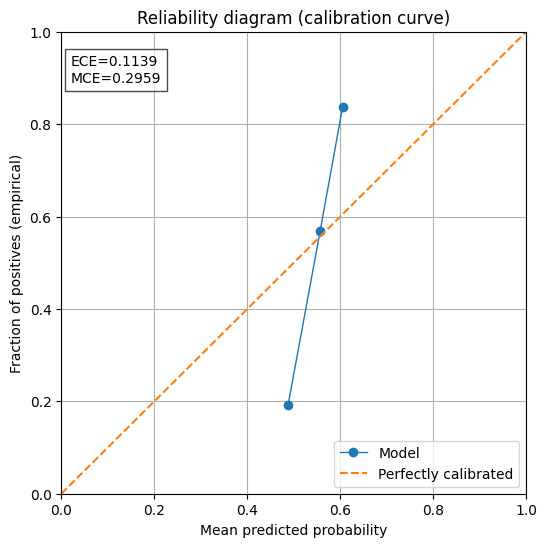

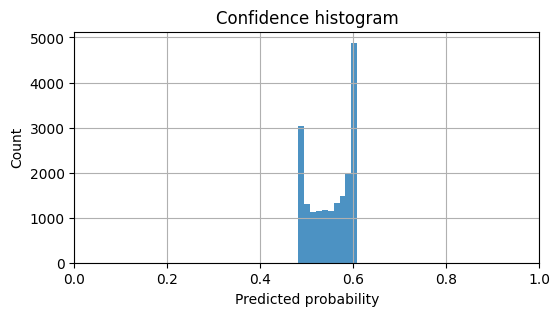

In [10]:

# 2) Process outputs to obtain numpy arrays and metrics
results = process_predict_outputs(predict_outputs, compute_metrics=True)

# results is a dict keyed by dataloader_idx. If you passed a single dataloader it's probably 0
res0 = results[0]
y_probs = res0["probs"]
y_true = res0["targets"]
metrics = res0["metrics"]

print("Metrics computed from predict outputs:")
print(metrics)

# 3) plot reliability diagram and confidence histogram
fig1, ax1 = plot_reliability_diagram(y_true, y_probs, n_bins=10)
fig2, ax2 = plot_confidence_histogram(y_probs, n_bins=10)

plt.show()


In [7]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# predict_outputs from trainer.predict(...)
def inspect_predict_outputs(predict_outputs, show_hist=True, n_bins=50):
    # handle nested structure: predict_outputs is a list of lists (per dataloader)
    if isinstance(predict_outputs, list) and all(isinstance(x, list) for x in predict_outputs):
        iter_loaders = enumerate(predict_outputs)
    else:
        iter_loaders = [(0, predict_outputs)]

    for dl_idx, batch_list in iter_loaders:
        vals = []
        targets = []
        for item in batch_list:
            if item is None:
                continue
            logits = item["logits"].detach().cpu().numpy().reshape(-1)
            targ = item["target"].detach().cpu().numpy().reshape(-1)
            vals.append(logits)
            targets.append(targ)
        if len(vals) == 0:
            print(f"DL {dl_idx}: no data")
            continue
        vals = np.concatenate(vals, axis=0)
        targets = np.concatenate(targets, axis=0)

        print(f"\nDATALOADER {dl_idx} — count: {len(vals)}")
        print("raw stats: min {:.6f}, max {:.6f}, mean {:.6f}, std {:.6f}".format(
            float(vals.min()), float(vals.max()), float(vals.mean()), float(vals.std())
        ))
        # how many are strictly within (0,1)? (indicator of probabilities)
        frac_in_0_1 = ((vals >= 0.0) & (vals <= 1.0)).mean()
        print(f"fraction of values in [0,1]: {frac_in_0_1:.3f}")

        # compute sigmoided version
        probs = 1 / (1 + np.exp(-vals))
        print("sigmoid(probs) stats: min {:.6f}, max {:.6f}, mean {:.6f}, std {:.6f}".format(
            float(probs.min()), float(probs.max()), float(probs.mean()), float(probs.std())
        ))

        # If a lot of raw values are in [0,1] AND sigmoid(probs) is also in a similar narrow range,
        # that suggests you may already have probabilities (and would be double-sigmoiding downstream).
        if show_hist:
            fig, axes = plt.subplots(1, 2, figsize=(10,3))
            axes[0].hist(vals, bins=n_bins)
            axes[0].set_title(f"raw outputs (dl {dl_idx})")
            axes[1].hist(probs, bins=n_bins)
            axes[1].set_title(f"sigmoid(raw) (dl {dl_idx})")
            plt.show()

        # quick heuristic: if raw min < 0 or raw max > 1 -> raw are logits (not probabilities)
        if (vals.min() < 0) or (vals.max() > 1):
            print("Heuristic: raw outputs extend outside [0,1] -> they are likely LOGITS.")
        else:
            print("Heuristic: raw outputs lie in [0,1] -> they MAY BE PROBABILITIES (or small logits).")



DATALOADER 0 — count: 18594
raw stats: min -0.074482, max 0.439937, mean 0.214051, std 0.179828
fraction of values in [0,1]: 0.801
sigmoid(probs) stats: min 0.481388, max 0.608244, mean 0.552919, std 0.044381


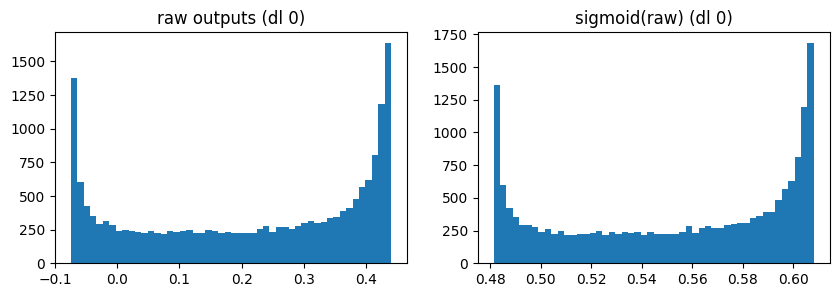

Heuristic: raw outputs extend outside [0,1] -> they are likely LOGITS.

DATALOADER 1 — count: 152819
raw stats: min -0.074973, max 0.439991, mean 0.208020, std 0.174478
fraction of values in [0,1]: 0.812
sigmoid(probs) stats: min 0.481265, max 0.608257, mean 0.551454, std 0.043065


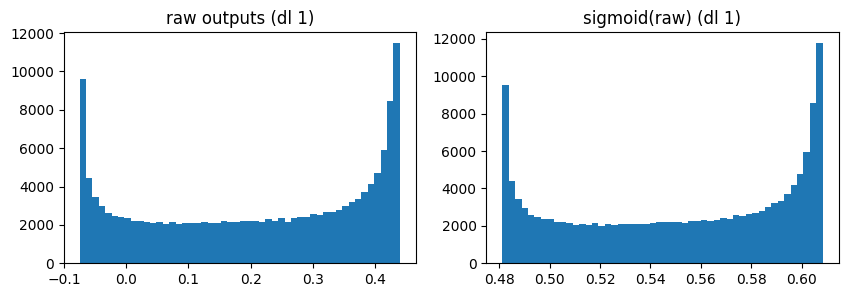

Heuristic: raw outputs extend outside [0,1] -> they are likely LOGITS.


In [14]:
inspect_predict_outputs(predict_outputs)

In [ ]:
import os
import pandas as pd
import re
convert_dict = {
    "dinucl_sampled": "dinucl-sampled",
    "dinucl_shuffled": "dinucl-shuffled",
}

# Define the folder path
folder_path = "/data/home/natant/Negatives/Runs/Review_rerun"

# Get all files ending in .ckpt
ckpt_files = [f for f in os.listdir(folder_path) if f.endswith('.ckpt')]

# Parse each filename to extract information
data = []
negative_types = ["dinucl-sampled", "celltype", "shuffled", "dinucl-shuffled", "neighbors"]
for filename in ckpt_files:   
    old_filename = filename
    for old_name, new_name in convert_dict.items():
        filename = filename.replace(old_name, new_name)
    parts = filename.split('_')
    neg_type = parts[-8]
    if neg_type not in negative_types:
        neg_type = "HQ"
        tf = '_'.join(parts[1:-7])
    else:
        tf = '_'.join(parts[1:-8])
        neg_type = parts[-8]

    
    # Extract cell line (first part)
    cellline = parts[0] 
    cv_split = parts[-7].split('-')[1]


    
    
    data.append({
        'filename': filename,
        'file_path': os.path.join(folder_path, old_filename),
        'cellline': cellline,
        'TF': tf,
        'negative_type': neg_type,
        'cv_split': cv_split
    })

# Create DataFrame
df_ckpt = pd.DataFrame(data)
df_ckpt

,filename,file_path,cellline,TF,negative_type,cv_split
0,GM12878_TCF12_dinucl-sampled_CV-4_20251031_02:...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,TCF12,dinucl-sampled,4
1,GM12878_NFIC_(SC-81335)_celltype_CV-4_20251103...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,NFIC_(SC-81335),celltype,4
2,GM12878_ETS1_celltype_CV-0_20251103_21:31_epoc...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,ETS1,celltype,0
3,GM12878_SIX5_shuffled_CV-2_20251030_19:51_epoc...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,SIX5,shuffled,2
4,GM12878_ZBTB33_celltype_CV-0_20251103_21:12_ep...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,ZBTB33,celltype,0
...,...,...,...,...,...,...
1423,GM12878_TBP_shuffled_CV-4_20251030_16:28_epoch...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,TBP,shuffled,4
1424,GM12878_NFIC_(SC-81335)_celltype_CV-1_20251103...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,NFIC_(SC-81335),celltype,1
1425,HepG2_FOXA1_(SC-101058)_neighbors_CV-5_2025103...,/data/home/natant/Negatives/Runs/Review_rerun/...,HepG2,FOXA1_(SC-101058),neighbors,5
1426,GM12878_ATF2_(SC-81188)_shuffled_CV-3_20251030...,/data/home/natant/Negatives/Runs/Review_rerun/...,GM12878,ATF2_(SC-81188),shuffled,3


In [5]:
df_ckpt.negative_type.unique()

array(['dinucl-sampled', 'celltype', 'shuffled', 'dinucl-shuffled',
       'neighbors', 'HQ'], dtype=object)

In [10]:
def get_predicts(model_ckpt_path, device=3, idx = 0):
    convert_dict = {
    "dinucl_sampled": "dinucl-sampled",
    "dinucl_shuffled": "dinucl-shuffled",
}
    filename = os.path.basename(model_ckpt_path)
    for old_name, new_name in convert_dict.items():
        filename = filename.replace(old_name, new_name)
    parts = filename.split('_')
    
    # Extract cell line (first part)
    cellline = parts[0]    
    cv_split = parts[-7].split('-')[1]
    neg_type = parts[-8]
    tf = '_'.join(parts[1:-8])
    Original_neg_mode = neg_type.replace('-', '_')

    if neg_type == "celltype":
        cellline_file = f"/data/home/natant/Negatives/Data/Encode690/ENCODE_hg38_subset_101bp_celltypes_ATAC_H5_all_chr copy/{cellline}.h5t"
    else:
        cellline_file = f"/data/home/natant/Negatives/Data/Encode690/ENCODE_hg38_subset_101bp_celltypes_ATAC_H5_all_chr/{cellline}.h5t"


    Dmod = DataModule(cellline_file, TF=tf, batch_size=256, neg_mode=Original_neg_mode, cross_val_set=int(cv_split))
    model = TFmodel.load_from_checkpoint(model_ckpt_path)

    trainer = pl.Trainer(
        max_steps=5_000_000,
        accelerator="gpu",
        devices=[device]
    )
    predict_outputs = trainer.predict(model, Dmod)[idx]
    return predict_outputs

In [7]:
selected_runs = df_ckpt[
    (df_ckpt['TF'] == 'ATF2_(SC-81188)') & 
    (df_ckpt['cellline'] == 'GM12878') & 
    (df_ckpt['cv_split'] == "0") & 
    (df_ckpt["negative_type"] != "HQ")
    ]

In [8]:
selected_runs["file_path"].to_list()

['/data/home/natant/Negatives/Runs/Review_rerun/GM12878_ATF2_(SC-81188)_dinucl_sampled_CV-0_20251030_22:33_epoch=10_val_loss=0.66_AUROC=0.77.ckpt',
 '/data/home/natant/Negatives/Runs/Review_rerun/GM12878_ATF2_(SC-81188)_neighbors_CV-0_20251030_22:56_epoch=10_val_loss=0.67_AUROC=0.70.ckpt',
 '/data/home/natant/Negatives/Runs/Review_rerun/GM12878_ATF2_(SC-81188)_celltype_CV-0_20251103_17:55_epoch=08_val_loss=0.67_AUROC=0.63.ckpt',
 '/data/home/natant/Negatives/Runs/Review_rerun/GM12878_ATF2_(SC-81188)_shuffled_CV-0_20251030_22:46_epoch=12_val_loss=0.45_AUROC=0.94.ckpt',
 '/data/home/natant/Negatives/Runs/Review_rerun/GM12878_ATF2_(SC-81188)_dinucl_shuffled_CV-0_20251030_22:40_epoch=15_val_loss=0.53_AUROC=0.81.ckpt']

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  29%|██▉       | 21/73 [00:00<00:00, 103.94it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 131.36it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   8%|▊         | 6/80 [00:00<00:02, 36.72it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 130.65it/s]


KeyboardInterrupt: 

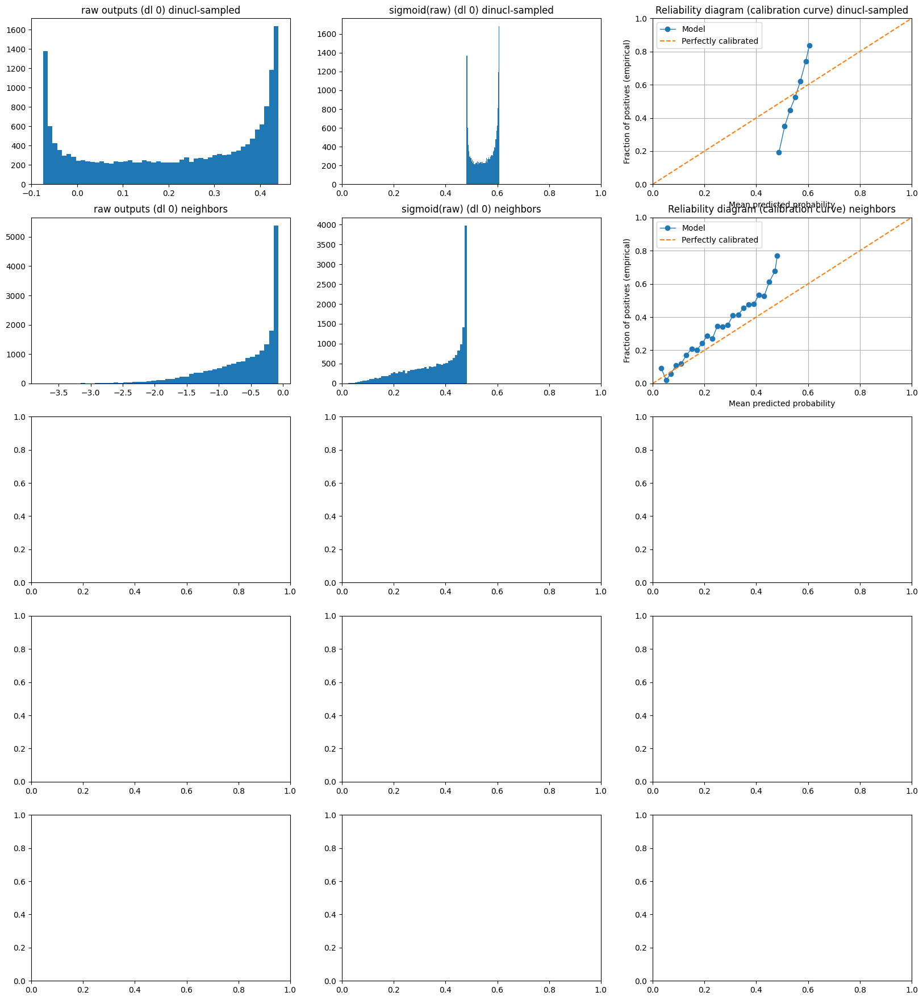

In [15]:
TF = 'ATF2_(SC-81188)'
cellline = 'GM12878'
for cross_val in range(5):
    selected_runs = df_ckpt[
    (df_ckpt['TF'] == TF) & 
    (df_ckpt['cellline'] == cellline) & 
    (df_ckpt['cv_split'] == str(cross_val)) & 
    (df_ckpt["negative_type"] != "HQ")
    ]
    num_negs = len(selected_runs["file_path"].to_list())
    fig, axes = plt.subplots(num_negs, 3, figsize=(20,22))
    n_bins = 50
    idx = 0
    for neg_i, model_ckpt_path in enumerate(selected_runs["file_path"].to_list()):
        batch_list = get_predicts(model_ckpt_path, device=3, idx = idx)

        vals = []
        targets = []
        for item in batch_list:
            if item is None:
                continue
            logits = item["logits"].detach().cpu().numpy().reshape(-1)
            targ = item["target"].detach().cpu().numpy().reshape(-1)
            vals.append(logits)
            targets.append(targ)
        vals = np.concatenate(vals, axis=0)
        targets = np.concatenate(targets, axis=0)

        # compute sigmoided version
        probs = 1 / (1 + np.exp(-vals))

        neg_type = selected_runs.iloc[neg_i]["negative_type"]
        
        axes[neg_i,0].hist(vals, bins=n_bins)
        axes[neg_i,0].set_title(f"raw outputs (dl {idx}) {neg_type}")
        axes[neg_i,1].hist(probs, bins=n_bins)
        axes[neg_i,1].set_title(f"sigmoid(raw) (dl {idx}) {neg_type}")
        axes[neg_i,1].set_xlim(0,1)
        prob_true, prob_pred = calibration_curve(targets, probs, n_bins=n_bins, strategy="uniform")
        axes[neg_i,2].plot(prob_pred, prob_true, marker='o', linewidth=1, label='Model')
        axes[neg_i,2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
        axes[neg_i,2].set_xlabel('Mean predicted probability')
        axes[neg_i,2].set_ylabel('Fraction of positives (empirical)')
        axes[neg_i,2].set_title(f'Reliability diagram (calibration curve) {neg_type}')
        axes[neg_i,2].set_xlim(0,1)
        axes[neg_i,2].set_ylim(0,1)
        axes[neg_i,2].legend()
        axes[neg_i,2].grid(True)
    plt.tight_layout()
    plt.show()

        

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  23%|██▎       | 22/96 [00:00<00:00, 108.35it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 145.39it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  20%|██        | 25/124 [00:00<00:00, 127.25it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:03<00:00, 150.97it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  17%|█▋        | 21/127 [00:00<00:01, 105.26it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 141.34it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   6%|▌         | 7/124 [00:00<00:03, 36.20it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 138.54it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   6%|▌         | 7/124 [00:00<00:03, 34.92it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 144.57it/s]


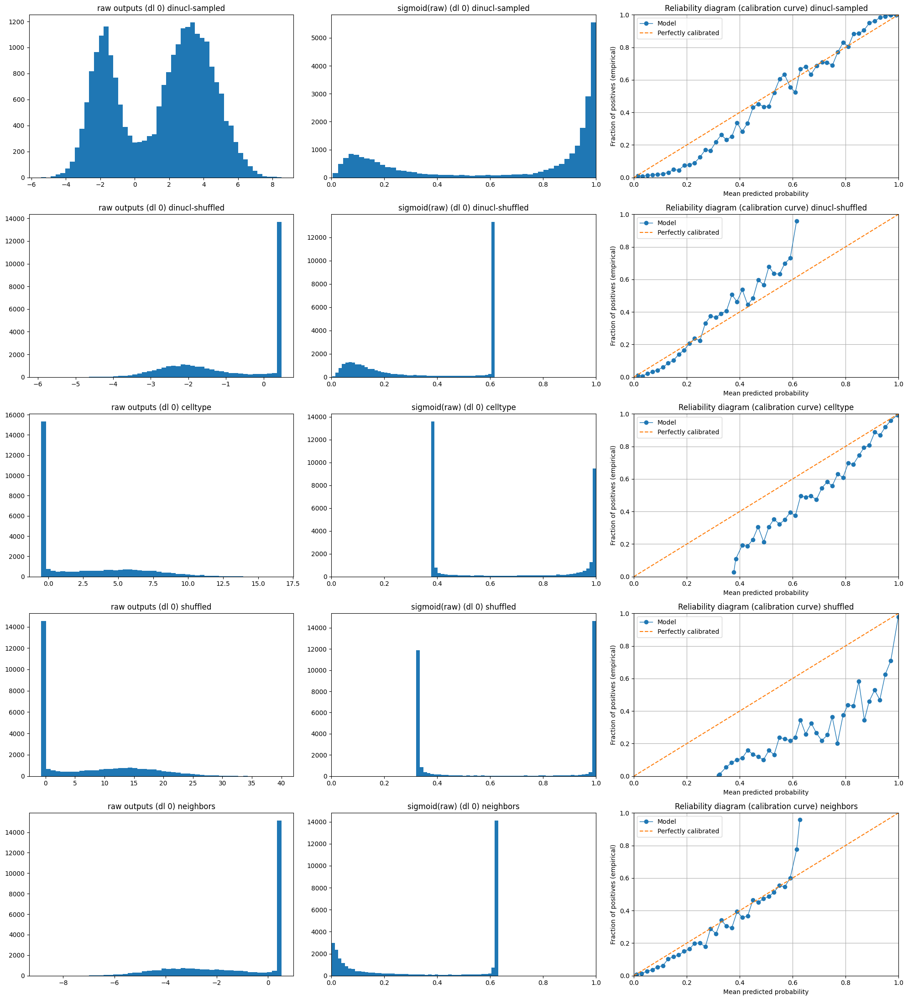

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   8%|▊         | 8/95 [00:00<00:02, 38.99it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:02<00:00, 150.59it/s]


/tmp/ipykernel_696070/3475212048.py:30: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-vals))
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   6%|▋         | 6/95 [00:00<00:02, 37.10it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:03<00:00, 137.08it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  25%|██▌       | 24/95 [00:00<00:00, 116.76it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:03<00:00, 132.05it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  21%|██        | 20/96 [00:00<00:00, 101.39it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:02<00:00, 144.57it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  27%|██▋       | 20/73 [00:00<00:00, 100.71it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:02<00:00, 150.52it/s]


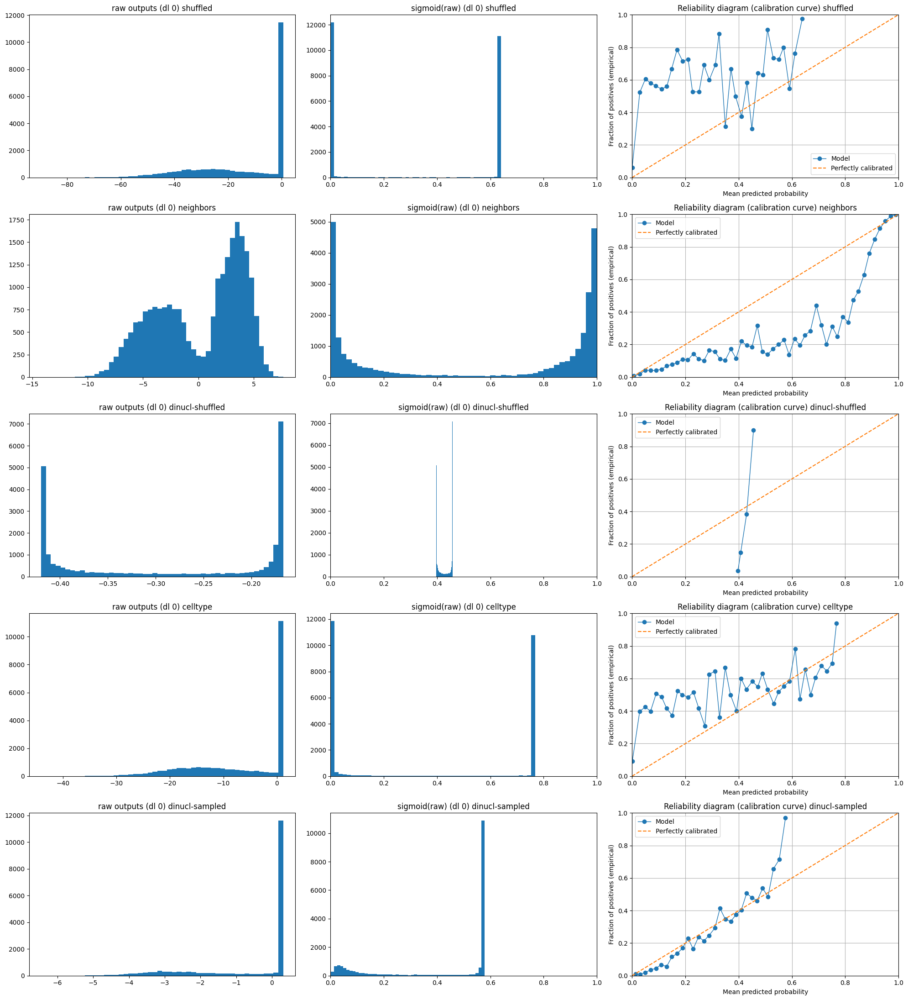

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  18%|█▊        | 17/96 [00:00<00:00, 84.83it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 140.23it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  17%|█▋        | 21/124 [00:00<00:00, 105.38it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 144.13it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   6%|▋         | 8/124 [00:00<00:02, 39.33it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 134.06it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   5%|▍         | 6/124 [00:00<00:03, 30.84it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:04<00:00, 140.75it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  19%|█▉        | 24/127 [00:00<00:00, 117.29it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 599/599 [00:03<00:00, 151.16it/s]


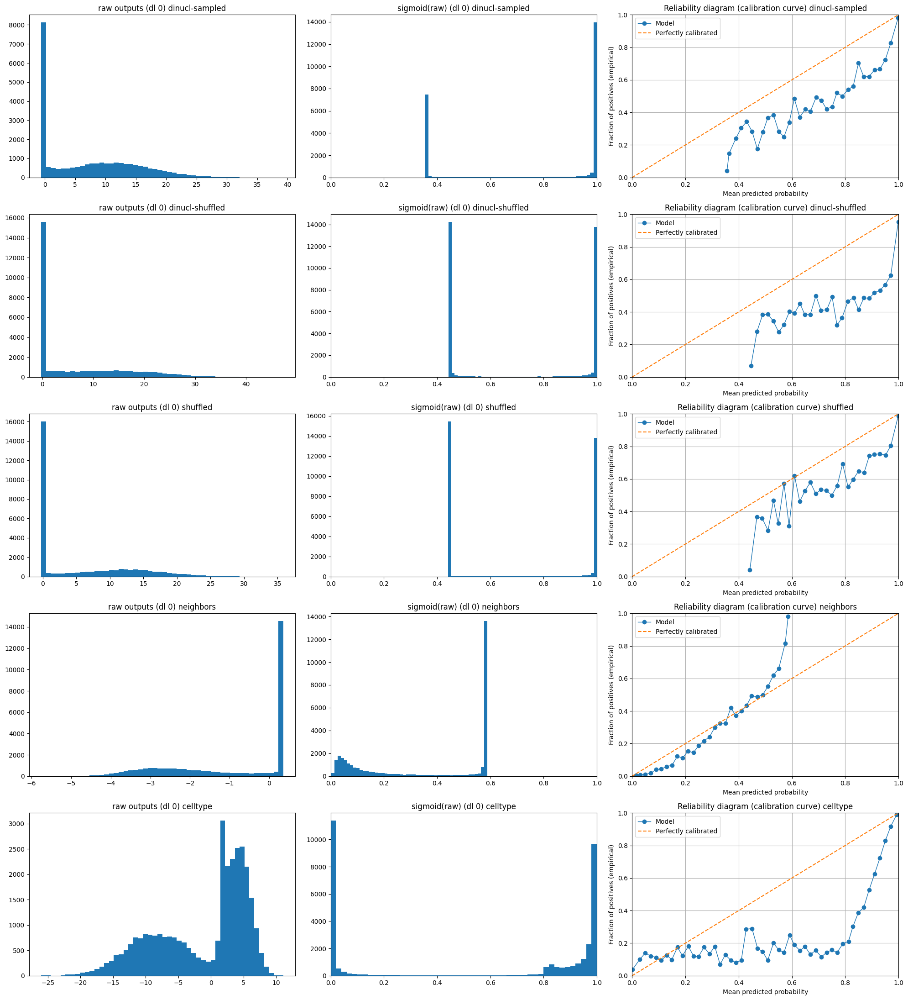

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  22%|██▏       | 20/92 [00:00<00:00, 104.64it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 420/420 [00:02<00:00, 146.27it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  31%|███       | 24/77 [00:00<00:00, 121.20it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 420/420 [00:02<00:00, 141.86it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   6%|▋         | 6/96 [00:00<00:02, 36.76it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 420/420 [00:02<00:00, 143.80it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  27%|██▋       | 26/96 [00:00<00:00, 128.21it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 420/420 [00:03<00:00, 139.11it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   7%|▋         | 7/96 [00:00<00:02, 35.46it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 420/420 [00:02<00:00, 149.10it/s]


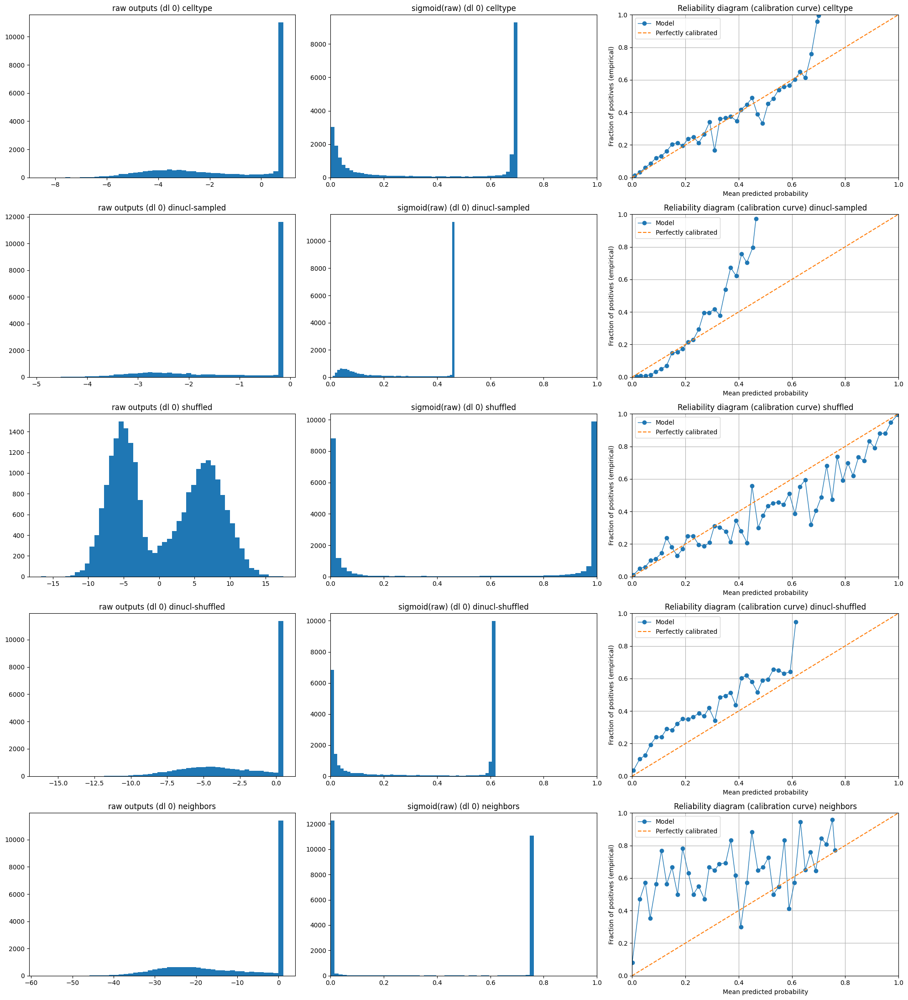

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   1%|          | 1/95 [00:00<00:01, 75.86it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:03<00:00, 138.49it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   6%|▋         | 6/95 [00:00<00:02, 34.27it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:03<00:00, 130.74it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  25%|██▌       | 24/96 [00:00<00:00, 119.44it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:03<00:00, 143.21it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  26%|██▋       | 25/95 [00:00<00:00, 123.60it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:02<00:00, 145.94it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  33%|███▎      | 24/73 [00:00<00:00, 117.03it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 430/430 [00:02<00:00, 149.66it/s]


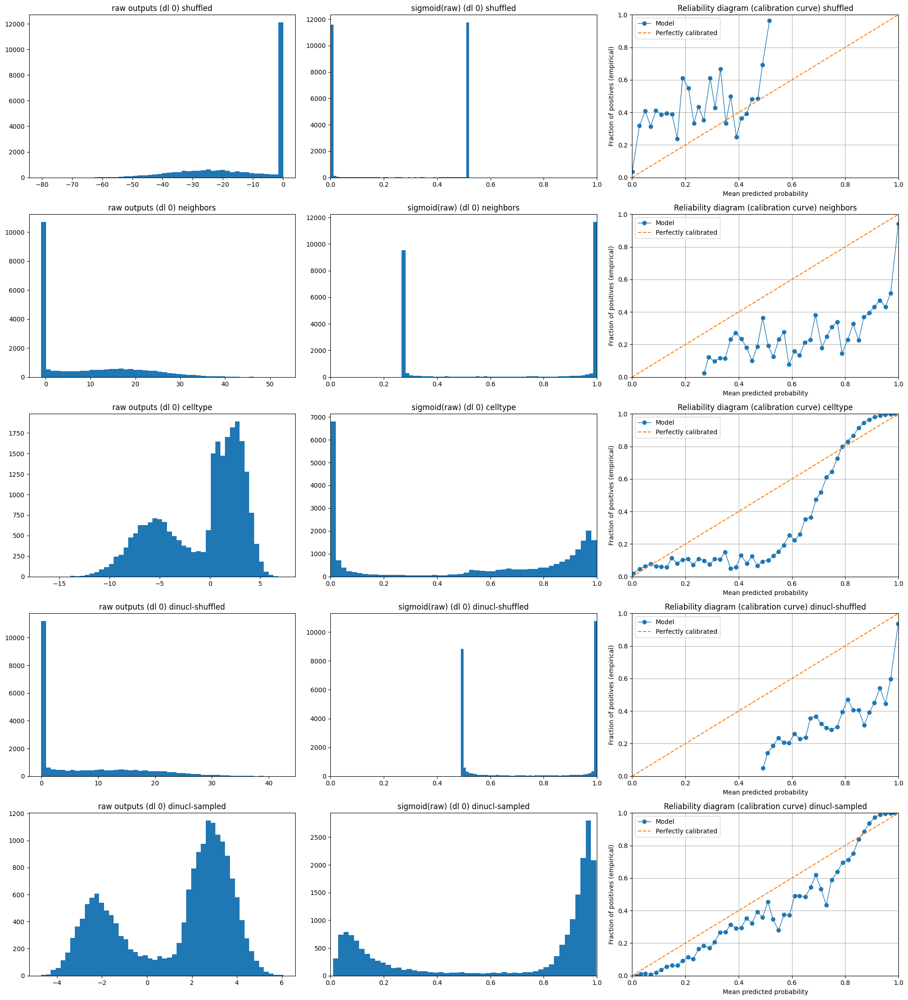

In [ ]:
TF = 'CTCF'
cellline = 'GM12878'
for cross_val in range(5):
    selected_runs = df_ckpt[
    (df_ckpt['TF'] == TF) & 
    (df_ckpt['cellline'] == cellline) & 
    (df_ckpt['cv_split'] == str(cross_val)) & 
    (df_ckpt["negative_type"] != "HQ")
    ]
    num_negs = len(selected_runs["file_path"].to_list())
    fig, axes = plt.subplots(num_negs, 3, figsize=(20,22))
    n_bins = 50
    idx = 0
    for neg_i, model_ckpt_path in enumerate(selected_runs["file_path"].to_list()):
        batch_list = get_predicts(model_ckpt_path, device=3, idx=idx)
        vals = []
        targets = []
        for item in batch_list:
            if item is None:
                continue
            logits = item["logits"].detach().cpu().numpy().reshape(-1)
            targ = item["target"].detach().cpu().numpy().reshape(-1)
            vals.append(logits)
            targets.append(targ)
        vals = np.concatenate(vals, axis=0)
        targets = np.concatenate(targets, axis=0)

        # compute sigmoided version
        probs = 1 / (1 + np.exp(-vals))

        neg_type = selected_runs.iloc[neg_i]["negative_type"]
        
        axes[neg_i,0].hist(vals, bins=n_bins)
        axes[neg_i,0].set_title(f"raw outputs (dl {idx}) {neg_type}")
        axes[neg_i,1].hist(probs, bins=n_bins)
        axes[neg_i,1].set_title(f"sigmoid(raw) (dl {idx}) {neg_type}")
        axes[neg_i,1].set_xlim(0,1)
        prob_true, prob_pred = calibration_curve(targets, probs, n_bins=n_bins, strategy="uniform")
        axes[neg_i,2].plot(prob_pred, prob_true, marker='o', linewidth=1, label='Model')
        axes[neg_i,2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
        axes[neg_i,2].set_xlabel('Mean predicted probability')
        axes[neg_i,2].set_ylabel('Fraction of positives (empirical)')
        axes[neg_i,2].set_title(f'Reliability diagram (calibration curve) {neg_type}')
        axes[neg_i,2].set_xlim(0,1)
        axes[neg_i,2].set_ylim(0,1)
        axes[neg_i,2].legend()
        axes[neg_i,2].grid(True)
    plt.tight_layout()
    plt.show()

        

💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  29%|██▉       | 21/73 [00:00<00:00, 105.34it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 141.80it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   8%|▊         | 6/80 [00:00<00:02, 32.21it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 129.23it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  28%|██▊       | 22/78 [00:00<00:00, 107.65it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 145.15it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   9%|▉         | 7/80 [00:00<00:02, 34.96it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 146.72it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  31%|███▏      | 25/80 [00:00<00:00, 125.15it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 148.70it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  50%|█████     | 25/50 [00:00<00:00, 121.88it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:02<00:00, 146.31it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  12%|█▏        | 6/51 [00:00<00:01, 32.58it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:03<00:00, 137.81it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  38%|███▊      | 20/53 [00:00<00:00, 98.29it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:02<00:00, 143.32it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  12%|█▏        | 6/51 [00:00<00:01, 37.18it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:02<00:00, 144.40it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  41%|████      | 21/51 [00:00<00:00, 103.23it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:03<00:00, 133.58it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  30%|███       | 22/73 [00:00<00:00, 109.68it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 131.90it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   8%|▊         | 6/80 [00:00<00:02, 34.90it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 144.36it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  27%|██▋       | 21/78 [00:00<00:00, 103.63it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 143.78it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:   8%|▊         | 6/80 [00:00<00:02, 34.22it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 144.35it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  29%|██▉       | 23/80 [00:00<00:00, 116.22it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 597/597 [00:04<00:00, 130.89it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  33%|███▎      | 18/55 [00:00<00:00, 91.86it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 415/415 [00:02<00:00, 152.19it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  11%|█         | 6/54 [00:00<00:01, 34.51it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 415/415 [00:02<00:00, 145.73it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  41%|████      | 22/54 [00:00<00:00, 107.41it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 415/415 [00:03<00:00, 132.25it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  13%|█▎        | 7/54 [00:00<00:01, 35.11it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 415/415 [00:02<00:00, 152.52it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  46%|████▋     | 25/54 [00:00<00:00, 122.72it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 415/415 [00:02<00:00, 143.98it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  40%|████      | 20/50 [00:00<00:00, 100.82it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:03<00:00, 136.14it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  12%|█▏        | 6/51 [00:00<00:01, 37.48it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:03<00:00, 136.89it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  49%|████▉     | 26/53 [00:00<00:00, 127.27it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:02<00:00, 146.95it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  14%|█▎        | 7/51 [00:00<00:01, 35.52it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:02<00:00, 143.70it/s]


💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
/data/home/natant/anaconda3/envs/Negs2/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `predict_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Predicting DataLoader 0:  53%|█████▎    | 27/51 [00:00<00:00, 132.92it/s]

/data/home/natant/Negatives/TFBS_negatives/TFBS_negatives/models.py:242: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_DNA = self.DNA_branch(self.embedding(torch.tensor(x_DNA_in, dtype=torch.int)).permute(0, 2, 1))


Predicting DataLoader 1: 100%|██████████| 429/429 [00:02<00:00, 146.49it/s]


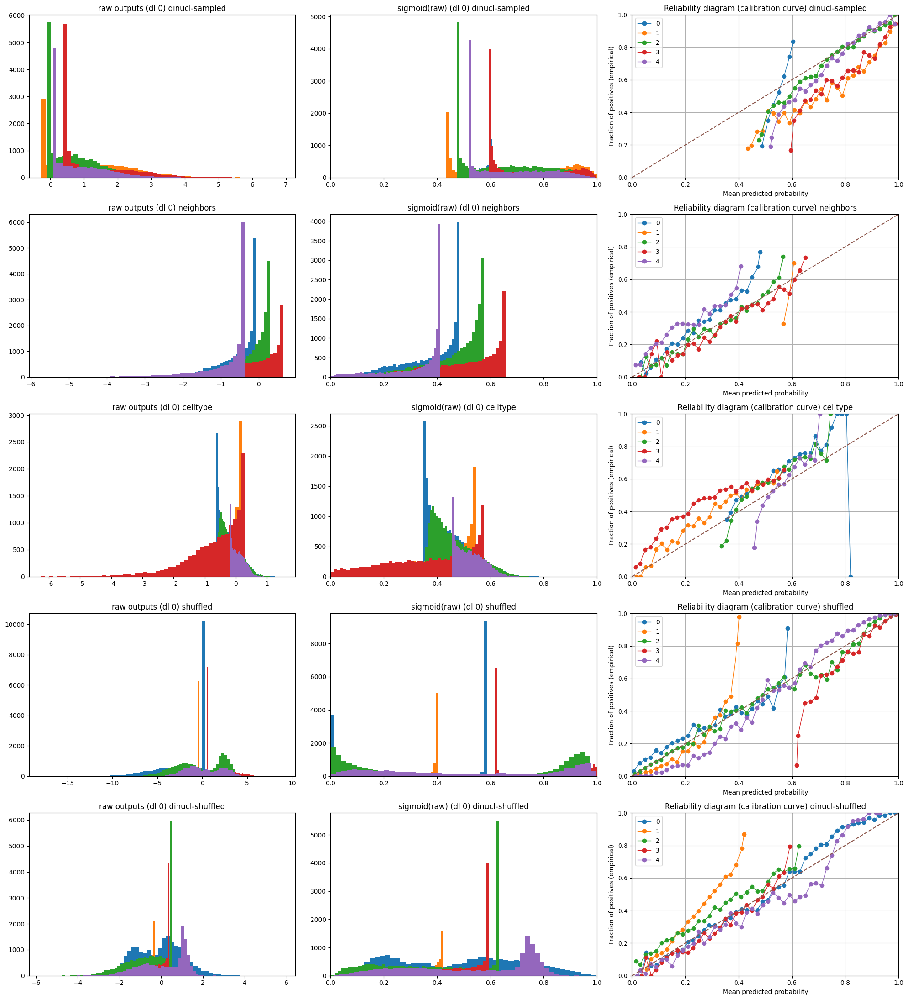

In [ ]:
TF = 'ATF2_(SC-81188)'
cellline = 'GM12878'


neg_type_order = ['dinucl-sampled', 'neighbors', 'celltype', 'shuffled', 'dinucl-shuffled']
num_negs = len(neg_type_order)
n_bins = 50
fig, axes = plt.subplots(num_negs, 3, figsize=(20,22))
idx = 0 # dataset

for cross_val in range(5):
    selected_runs = df_ckpt[
    (df_ckpt['TF'] == TF) & 
    (df_ckpt['cellline'] == cellline) & 
    (df_ckpt['cv_split'] == str(cross_val)) & 
    (df_ckpt["negative_type"] != "HQ")
    ]
    for neg_type in neg_type_order:
        model_ckpt_path = selected_runs[selected_runs["negative_type"] == neg_type]["file_path"].values[0]
        batch_list = get_predicts(model_ckpt_path, device=3, idx=idx)
        vals = []
        targets = []
        for item in batch_list:
            if item is None:
                continue
            logits = item["logits"].detach().cpu().numpy().reshape(-1)
            targ = item["target"].detach().cpu().numpy().reshape(-1)
            vals.append(logits)
            targets.append(targ)
        vals = np.concatenate(vals, axis=0)
        targets = np.concatenate(targets, axis=0)

        # compute sigmoided version
        probs = 1 / (1 + np.exp(-vals))

        
        axes[neg_type_order.index(neg_type),0].hist(vals, bins=n_bins)
        axes[neg_type_order.index(neg_type),0].set_title(f"raw outputs (dl {idx}) {neg_type}")
        axes[neg_type_order.index(neg_type),1].hist(probs, bins=n_bins)
        axes[neg_type_order.index(neg_type),1].set_title(f"sigmoid(raw) (dl {idx}) {neg_type}")
        axes[neg_type_order.index(neg_type),1].set_xlim(0,1)
        prob_true, prob_pred = calibration_curve(targets, probs, n_bins=n_bins, strategy="uniform")
        axes[neg_type_order.index(neg_type),2].plot(prob_pred, prob_true, marker='o', linewidth=1, label=str(cross_val))
        #axes[neg_type_order.index(neg_type),2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
        axes[neg_type_order.index(neg_type),2].set_xlabel('Mean predicted probability')
        axes[neg_type_order.index(neg_type),2].set_ylabel('Fraction of positives (empirical)')
        axes[neg_type_order.index(neg_type),2].set_title(f'Reliability diagram (calibration curve) {neg_type}')
        axes[neg_type_order.index(neg_type),2].set_xlim(0,1)
        axes[neg_type_order.index(neg_type),2].set_ylim(0,1)
        axes[neg_type_order.index(neg_type),2].legend()
        axes[neg_type_order.index(neg_type),2].grid(True)
for neg_type in neg_type_order:
    axes[neg_type_order.index(neg_type),2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
plt.tight_layout()
plt.show()


In [ ]:
output_folder = "/data/home/natant/Negatives/Runs/Review_rerun/Calibration_plots/"
os.makedirs(output_folder, exist_ok=True)

In [ ]:
cellline = 'GM12878'
neg_type_order = ['dinucl-sampled', 'neighbors', 'celltype', 'shuffled', 'dinucl-shuffled']
num_negs = len(neg_type_order)
n_bins = 50
idx = 0 # dataset

TF_list = df_ckpt['TF'].unique().tolist()

for TF in TF_list:

    fig, axes = plt.subplots(num_negs, 3, figsize=(20,22))


    for cross_val in range(5):
        selected_runs = df_ckpt[
        (df_ckpt['TF'] == TF) & 
        (df_ckpt['cellline'] == cellline) & 
        (df_ckpt['cv_split'] == str(cross_val)) & 
        (df_ckpt["negative_type"] != "HQ")
        ]
        for neg_type in neg_type_order:
            model_ckpt_path = selected_runs[selected_runs["negative_type"] == neg_type]["file_path"].values[0]
            batch_list = get_predicts(model_ckpt_path, device=3, idx=idx)
            vals = []
            targets = []
            for item in batch_list:
                if item is None:
                    continue
                logits = item["logits"].detach().cpu().numpy().reshape(-1)
                targ = item["target"].detach().cpu().numpy().reshape(-1)
                vals.append(logits)
                targets.append(targ)
            vals = np.concatenate(vals, axis=0)
            targets = np.concatenate(targets, axis=0)

            # compute sigmoided version
            probs = 1 / (1 + np.exp(-vals))

            
            axes[neg_type_order.index(neg_type),0].hist(vals, bins=n_bins)
            axes[neg_type_order.index(neg_type),0].set_title(f"raw outputs (dl {idx}) {neg_type}")
            axes[neg_type_order.index(neg_type),1].hist(probs, bins=n_bins)
            axes[neg_type_order.index(neg_type),1].set_title(f"sigmoid(raw) (dl {idx}) {neg_type}")
            axes[neg_type_order.index(neg_type),1].set_xlim(0,1)
            prob_true, prob_pred = calibration_curve(targets, probs, n_bins=n_bins, strategy="uniform")
            axes[neg_type_order.index(neg_type),2].plot(prob_pred, prob_true, marker='o', linewidth=1, label=str(cross_val))
            #axes[neg_type_order.index(neg_type),2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
            axes[neg_type_order.index(neg_type),2].set_xlabel('Mean predicted probability')
            axes[neg_type_order.index(neg_type),2].set_ylabel('Fraction of positives (empirical)')
            axes[neg_type_order.index(neg_type),2].set_title(f'Reliability diagram (calibration curve) {neg_type}')
            axes[neg_type_order.index(neg_type),2].set_xlim(0,1)
            axes[neg_type_order.index(neg_type),2].set_ylim(0,1)
            axes[neg_type_order.index(neg_type),2].legend()
            axes[neg_type_order.index(neg_type),2].grid(True)
    for neg_type in neg_type_order:
        axes[neg_type_order.index(neg_type),2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
    
    fig.suptitle(f'{cellline} - {TF} - Calibration curves across CV folds', fontsize=16, y=0.995)
    plt.savefig(f'{cellline}_{TF}_calibration.png', dpi=150, bbox_inches='tight')
    plt.tight_layout()
    plt.show()


In [15]:
selected_runs.negative_type.tolist()

['dinucl-sampled', 'neighbors', 'celltype', 'shuffled', 'dinucl-shuffled']

In [ ]:


fig, axes = plt.subplots(num_negs, 3, figsize=(20,22))
n_bins = 50
idx = 0

for cross_val in range(5):
    selected_runs = df_ckpt[
    (df_ckpt['TF'] == TF) & 
    (df_ckpt['cellline'] == cellline) & 
    (df_ckpt['cv_split'] == str(cross_val)) & 
    (df_ckpt["negative_type"] != "HQ")
    ]
    for neg_i, model_ckpt_path in enumerate(selected_runs["file_path"].to_list()):
        batch_list = get_predicts(model_ckpt_path, device=3, idx=idx)
        vals = []
        targets = []
        for item in batch_list:
            if item is None:
                continue
            logits = item["logits"].detach().cpu().numpy().reshape(-1)
            targ = item["target"].detach().cpu().numpy().reshape(-1)
            vals.append(logits)
            targets.append(targ)
        vals = np.concatenate(vals, axis=0)
        targets = np.concatenate(targets, axis=0)

        # compute sigmoided version
        probs = 1 / (1 + np.exp(-vals))

        neg_type = selected_runs.iloc[neg_i]["negative_type"]
        
        axes[neg_i,0].hist(vals, bins=n_bins)
        axes[neg_i,0].set_title(f"raw outputs (dl {idx}) {neg_type}")
        axes[neg_i,1].hist(probs, bins=n_bins)
        axes[neg_i,1].set_title(f"sigmoid(raw) (dl {idx}) {neg_type}")
        axes[neg_i,1].set_xlim(0,1)
        prob_true, prob_pred = calibration_curve(targets, probs, n_bins=n_bins, strategy="uniform")
        axes[neg_i,2].plot(prob_pred, prob_true, marker='o', linewidth=1, label='Model')
        axes[neg_i,2].plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
        axes[neg_i,2].set_xlabel('Mean predicted probability')
        axes[neg_i,2].set_ylabel('Fraction of positives (empirical)')
        axes[neg_i,2].set_title(f'Reliability diagram (calibration curve) {neg_type}')
        axes[neg_i,2].set_xlim(0,1)
        axes[neg_i,2].set_ylim(0,1)
        axes[neg_i,2].legend()
        axes[neg_i,2].grid(True)
    plt.tight_layout()
    plt.show()

        